# BE/Bi 103, Fall 2016: Homework 9

## Due 1pm, Wednesday, December 9

(c) 2016 Justin Bois. This work is licensed under a [Creative Commons Attribution License CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/). All code contained therein is licensed under an [MIT license](https://opensource.org/licenses/MIT).

*This document was generated from a Jupyter notebook.  You can download the notebook [here](hw9_solutions.ipynb).*

In [1]:
import glob
import os

# Our numerical workhorses
import numpy as np
import pandas as pd
import scipy.ndimage
import scipy.optimize
import scipy.signal
import scipy.stats as st
import numba

# Image processing tools
import skimage
import skimage.io
import skimage.filters
import skimage.measure
import skimage.morphology
import skimage.segmentation

import bebi103

import corner

import matplotlib.pyplot as plt
import seaborn as sns
rc={'lines.linewidth': 2, 'axes.labelsize': 14, 'axes.titlesize': 14}
sns.set(rc=rc)
%matplotlib inline

# Import Bokeh modules for interactive plotting
import bokeh
bokeh.io.output_notebook()

Loading BokehJS ...

### Problem 9.1: Caulobacter growth, 95 pts

In this problem, we will study the growth and division of *Caulobacter crescentus* over time.  The lab of [Norbert Scherer](http://schererlab.uchicago.edu) at the University of Chicago acquired these data and recently published the work in PNAS, which you can download [here](http://bebi103.caltech.edu/2015/protected/papers/iyer-biswas_2014.pdf).

The clever experimental set-up allows imaging of single dividing cells in conditions that are identical through time.  This is accomplished by taking advantage of a unique morphological feature of *Caulobacter*.  The mother cell is adherent to the a surface through its stalk.  Upon division, one of the daughter cells does not have a stalk and is mobile.  The system is part of a microfluidic device that gives a constant flow.  So, every time a mother cell divides, the un-stalked daughter cell gets washed away.  In such a way, the dividing cells are never in a crowded environment and the buffer is always fresh.  This also allows for easier segmentation.

The data are available [here](https://www.dropbox.com/s/g9o11fjy7xrhnmq/iyer_biswas_et_al.zip?dl=0).  They were kindly provided by Charlie Wright in the Scherer lab.  The frame rate is 1 frame per minute.  The interpixel spacing is 0.052 µm.  All images were acquired at 24 $^\circ$C.

As with any of the problems in this class, you are encouraged to explore the data beyond what is asked for specifically in the problems statements.  The paper is also a very interesting read.

**a)** The directory `sequential_full_field` contains 10 sequential frames of a full field of bacteria in the microfluidic device.  From these frames, choose which bacteria would be good to use to gather long time course imaging.  I.e., choose those that you think will give minimal errors in segmentation.  Give your reasoning, including images demonstrating segmentation.

**b)** The files `bacterium_1.tif` and `bacterium_2.tif` are TIFF stacks of time courses for specific cells in from the full field images.  From these time courses, compute the time scale of division of the cells.  In other words, compute the time between divisions for each division for each cell and plot the results.  Comment on any interesting aspects of these data.

**c)** We know that under ideal conditions, bacterial cells experience exponential growth in bulk. That is, the number of cells grows exponentially. This is possible regardless of how individual cells growth; the repeated divisions leads to exponential growth. In their paper, the authors argue that the growth rate of *each* cell is also exponential.  I.e.,

\begin{align}
a(t) = a_0 \mathrm{e}^{\kappa t},
\end{align}

where $a(t)$ is the area of the cell in the image as a function of time and $a_0$ is the area of the cell right after a division has been completed, which we mark as $t = 0$.

As an alternative model, the authors consider a linear growth model, in which

\begin{align}
a(t) = a_0 + b t.
\end{align}

An exponential curve is approximately linear (with $b = a_0\kappa$) for short time scales.  So, it is often difficult to distinguish between a linear and an exponential growth rate.  Use the model selection methods we learned in class to assess the relative probabilities that the growth rate is exponential versus linear. You may consider using a hierarchical model.

### Problem 9.1: Solution
**a)** We will begin by loading one of the images and looking at it.

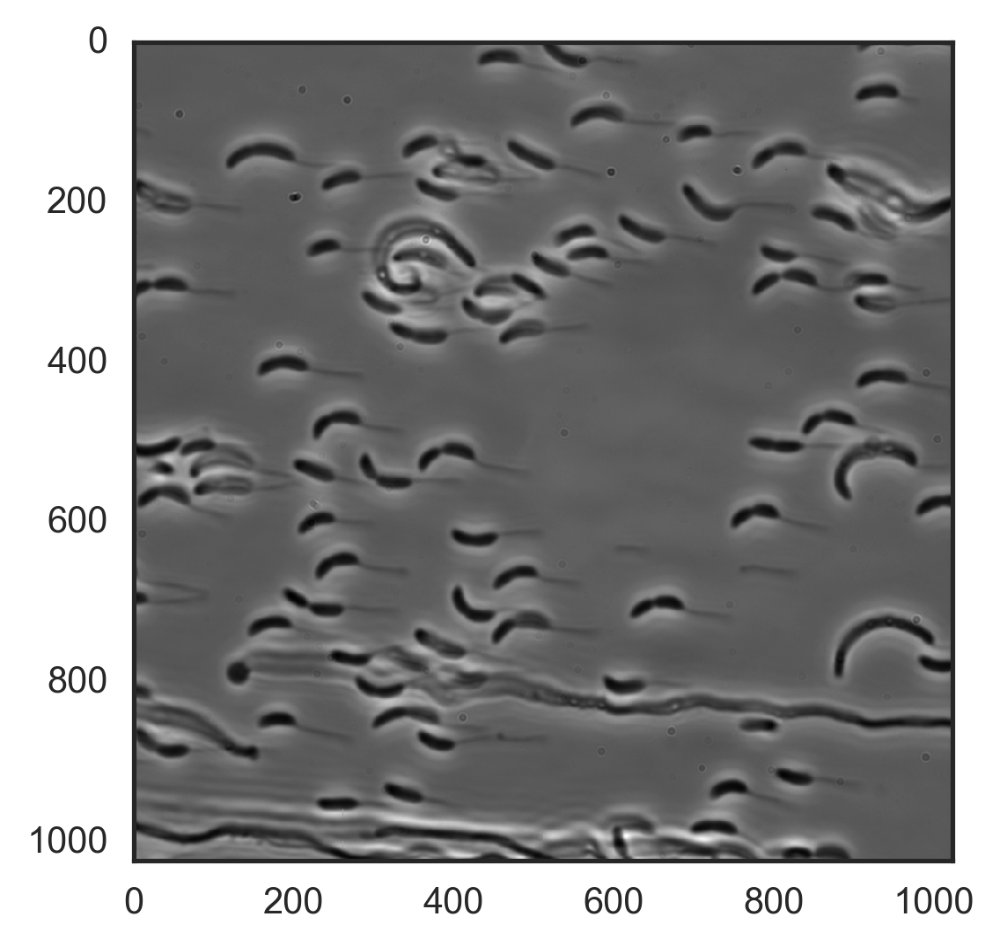

In [2]:
# Load image
data_dir = '../data/iyer_biswas_et_al'
fname = os.path.join(data_dir, 'sequential_full_field/phase03000.tif')
im = skimage.io.imread(fname)

# Display image
with sns.axes_style('white'):
    plt.imshow(im, cmap=plt.cm.gray)

The best bacteria to segment are those that do not have many neighbors and do not have artifacts around them.  This allows us to use simple thresholding for segmentation.  Let's try a simple global threshold.

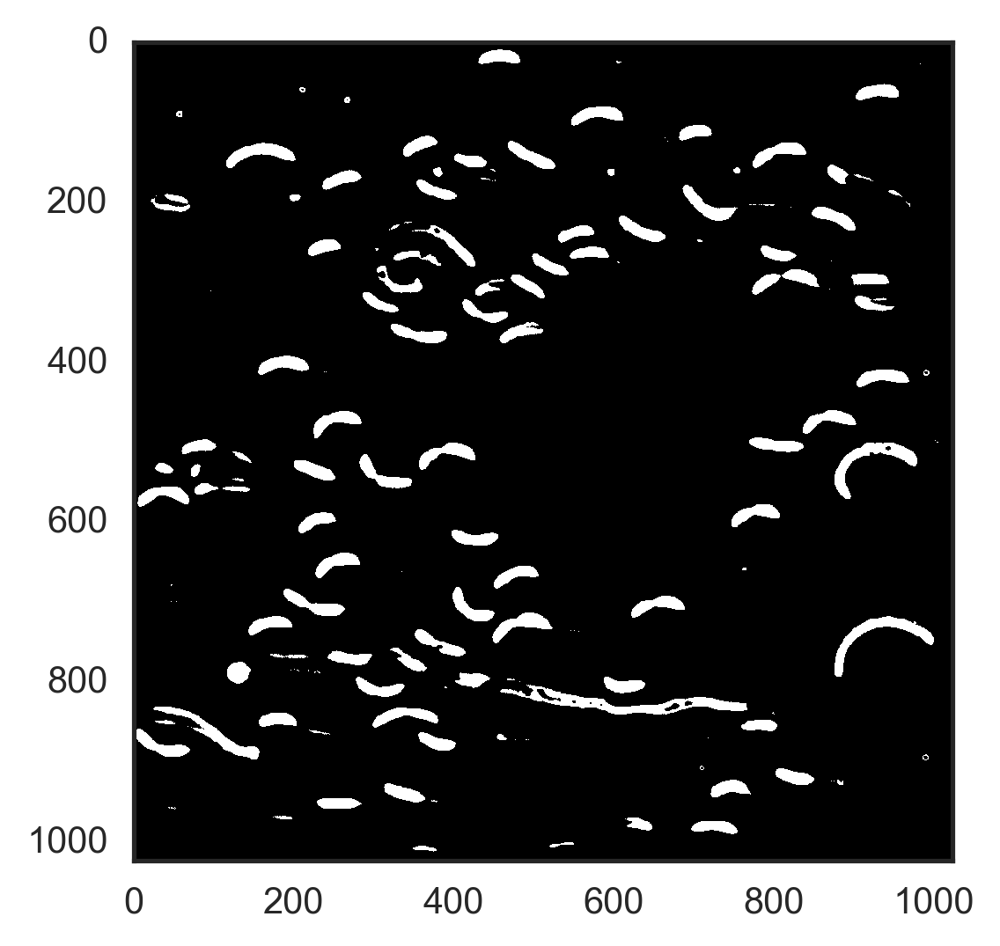

In [3]:
thresh = skimage.filters.threshold_isodata(im)
im_bw = im < thresh
im_bw = skimage.segmentation.clear_border(im_bw)
with sns.axes_style('white'):
    plt.imshow(im_bw, cmap=plt.cm.gray)

I then took this image and used `plt.ginput()` to click on pixels within good candidate bacteria.

In [4]:
# Indices in good bacteria
good_inds = np.array([(180.83333333333343, 138.16666666666674),
                      (791.5, 588.83333333333337),
                      (674.16666666666674, 703.5),
                      (428.83333333333343, 626.16666666666674),
                      (199.50000000000006, 404.83333333333337)]).astype(int)

Now, I'll label the image and compute region props, keeping only regions that contain the pixels I clicked.

In [5]:
# Label binary image
im_labeled, n_labels = skimage.measure.label(
                    im_bw, background=-1, return_num=True)

# Compute region props
im_props = skimage.measure.regionprops(im_labeled)

# Find regions to keep
for prop in im_props:
    keep = False
    for ind in good_inds:
        if (prop.bbox[0] < ind[1] < prop.bbox[2]) and \
                      (prop.bbox[1] < ind[0] < prop.bbox[3]):
            keep = True
    if not keep:
        im_bw[im_labeled==prop.label] = 0

Now we can overlay the ones we picked.

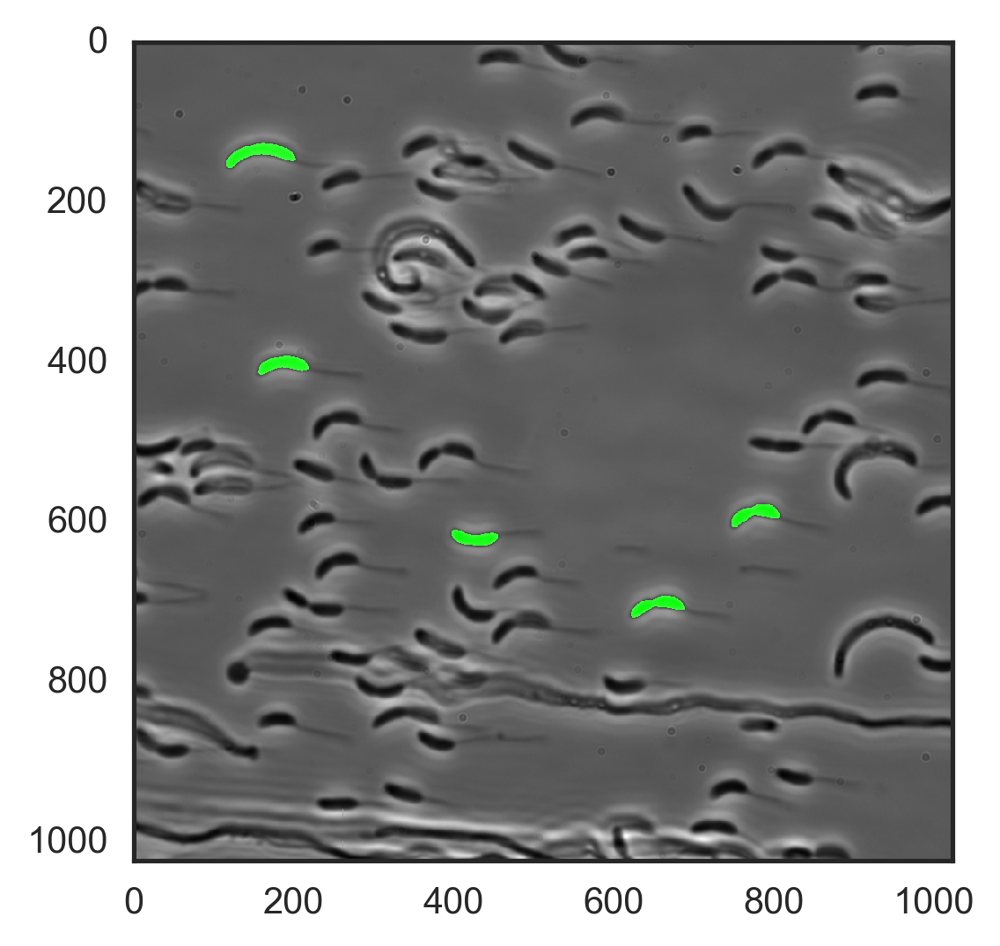

In [6]:
# Convert phase image to float RGB
im_float = (im.astype(float) - im.min()) / (im.max() - im.min())

# Make the green channel 1 wherever we have a bacterium
im_g = np.copy(im_float)
im_g[im_bw] = 1

# Build RGB image
im_rgb = np.dstack((im_float, im_g, im_float))

# Display image
with sns.axes_style('white'):
    plt.imshow(im_rgb)

These are the bacteria that are nicely separated and easily segmented.

**b)** Our strategy to find division events is this:

1. Use simple thresholding to segment the image into bacteria and not bacteria.
2. Clear the borders for bacteria that are not of central interest.
3. Label the image and compute region props.
4. Take the area of the largest object as the area of the bacterium of interest.  These constitute the time series data of area vs. time.
5. Delete areas that are obvious segmentation areas where the area is unreasonably large or small.  In this case, we take the lower bound on bacterial size to be 1 µm and the upper bound to be 3.5 µm.
6. Perform a median filter on the remaining area vs. time data.  This eliminates one-off outliers.
7. Find the time points where the median filtered trace has a down-crossing of a threshold.  This threshold is larger than the size of the mother bacterium, in our case, 2 µm.
8. Only downcrossings followed by ten minutes of growth are allowed.  This is a further check to make sure an outlier did not affect the division point.

We start by writing a function to compute the area of the bacteria in the image using thresholding.

In [7]:
def area_thresh(im, interpixel_distance):
    """
    Threshold an image and return the area of the largest object.
    """
    # Threshold image
    im_bw = im < skimage.filters.threshold_otsu(im)
    
    # Clear borders
    im_bw = skimage.segmentation.clear_border(im_bw)
    
    # Label binary image
    im_labeled = skimage.measure.label(im_bw, background=0, return_num=False)
    
    # Find areas of all objects
    im_props = skimage.measure.regionprops(im_labeled)

    # Find largest area
    max_area = 0
    for prop in im_props:
        if prop.area > max_area:
            max_area = prop.area

    return max_area * interpixel_distance**2

Since we will be doing this many times, we should check to see what speed bottlenecks there are and how we can deal with them. This function processes each image, so its call, in addition to loading the image, is the bulk of the image processing.

We'll start by timing how long it takes to load an image.

In [8]:
# Images and metadata
data_dir = '../data/iyer_biswas_et_al'
fname = os.path.join(data_dir, 'bacterium_2.tif')

# Load image collection
ic = skimage.io.ImageCollection(fname)

# Function to load 10 images
def im_load_speed_test(ic):
    for im in ic[:10]:
        pass

%timeit im_load_speed_test(ic)

1 loop, best of 3: 15.3 s per loop


Wow. That is really slow. Given that there are 8700 images in the second data set and it took 15 seconds to load ten of them, this is not a reasonable approach. We cannot pay the overhead of using an `ImageCollection`. Instead, we can directly load the TIFF stack into RAM and a 3D NumPy array. Let's see how long this takes.

In [9]:
# Load image collection as 2D NumPy array
ic = skimage.io.imread(fname)

%timeit im_load_speed_test(ic)

100000 loops, best of 3: 2.53 µs per loop


Orders of magnitude faster! So, we just need to make sure we read in the image data as a 3D NumPy array going forward.

We'll now write a function to generate the area vs. time curve as well as the indices where division occurs.

In [10]:
def areas_divisions(t, ic, interpixel_distance, div_thresh, n_below, abs_thresh,
                    median_kernel_size):
    """
    Compute areas of mother bacterium over time
    """
    # Compute the bacterial area for each image
    areas = np.empty(len(ic))
    for i, im in enumerate(ic):
        areas[i] = area_thresh(im, interpixel_distance)
        
    # Determine which points are good
    good_inds = (areas > abs_thresh[0]) & (areas < abs_thresh[1])
    
    # Slice out good data points
    t = t[good_inds]
    areas = areas[good_inds]

    # Perform median filter to eliminate outliers
    areas_filt = scipy.signal.medfilt(areas, kernel_size=median_kernel_size)

    # Get downcrossings
    down_inds = np.where((areas_filt[:-1] > div_thresh) 
                        & (areas_filt[1:] < div_thresh))[0] + 1

    # Filter out spurious downcrossings
    div_inds = [i for i in down_inds 
                        if np.all(areas_filt[i:i+n_below] < div_thresh)]
    
    return t, areas, div_inds

Now we can proceed with our analysis for the first bacterium.  We will use a kernel size of 9 time points for our median kernel.

In [11]:
# Images and metadata
data_dir = '../data/iyer_biswas_et_al'
fname = os.path.join(data_dir, 'bacterium_1.tif')
interpixel_distance = 0.052  # µm
dt = 1 # minutes

# Threshold for division
div_thresh = 2  # µm^2

# Absolute thresholds for big and small cells
abs_thresh = (1, 3.5) # µm^2

# Number of time points below threshold to be considered divided
n_below = 10

# Size of median filter kernel
median_kernel_size = 9

# Load images
ic = skimage.io.imread(fname)

# Determine time points
t_1 = np.arange(len(ic)) / dt

# Get area/time curve with division points
t_1, areas_1, div_inds_1 = areas_divisions(
        t_1, ic, interpixel_distance, div_thresh, n_below, abs_thresh, 
        median_kernel_size)

Now we can plot the cell areas and division events.  Note that even though we used the median filtered time series to find division events, we plot the unfiltered areas.

In [12]:
# Set up the figure (this is like a canvas you will paint on)
p = bokeh.plotting.figure(plot_width=650, plot_height=250,
                          x_axis_label='time(s)',
                          y_axis_label='cell area (sq µm)',
                          tools='pan,box_zoom,wheel_zoom,reset')

# Specify the glyphs
p.circle(t_1, areas_1, size=3)
for di in div_inds_1:
    p.ray(x=t_1[di], y=0, length=0, angle=90, angle_units='deg',
          color='tomato', line_width=2)
    p.ray(x=t_1[di], y=0, length=0, angle=-90, angle_units='deg',
          color='tomato', line_width=2)

bokeh.io.show(p)

Our analysis looks pretty good.  Even though we had some outliers, we still got the division points right.  Note that in come cases, the cell area goes down before the precipitous drop.  This could be due to a cell being almost pinched off and coming in and out of the focal plane, leading to errors in segmentation.

We can repeat the analysis for the other bacterium.

In [13]:
# Images and metadata
fname = os.path.join(data_dir, 'bacterium_2.tif')

# Load images
ic = skimage.io.imread(fname)

# Determine time points
t_2 = np.arange(len(ic)) / dt

# Do the calculation
t_2, areas_2, div_inds_2 = areas_divisions(
        t_2, ic, interpixel_distance, div_thresh, n_below, abs_thresh, 
        median_kernel_size)

We'll plot the time trace for this one as well.

In [14]:
# Set up the figure (this is like a canvas you will paint on)
p = bokeh.plotting.figure(plot_width=650, plot_height=250,
                          x_axis_label='time(s)',
                          y_axis_label='cell area (sq µm)',
                          tools='pan,box_zoom,wheel_zoom,reset')

# Specify the glyphs
p.circle(t_2, areas_2, size=3)
for di in div_inds_2:
    p.ray(x=t_2[di], y=0, length=0, angle=90, angle_units='deg',
          color='tomato', line_width=2)
    p.ray(x=t_2[di], y=0, length=0, angle=-90, angle_units='deg',
          color='tomato', line_width=2)

bokeh.io.show(p)

It is hard to see without zooming, but you can scroll around the plot and see that we identified all of the division points.

Now, let's look at the distributions of division times for each bacterium.

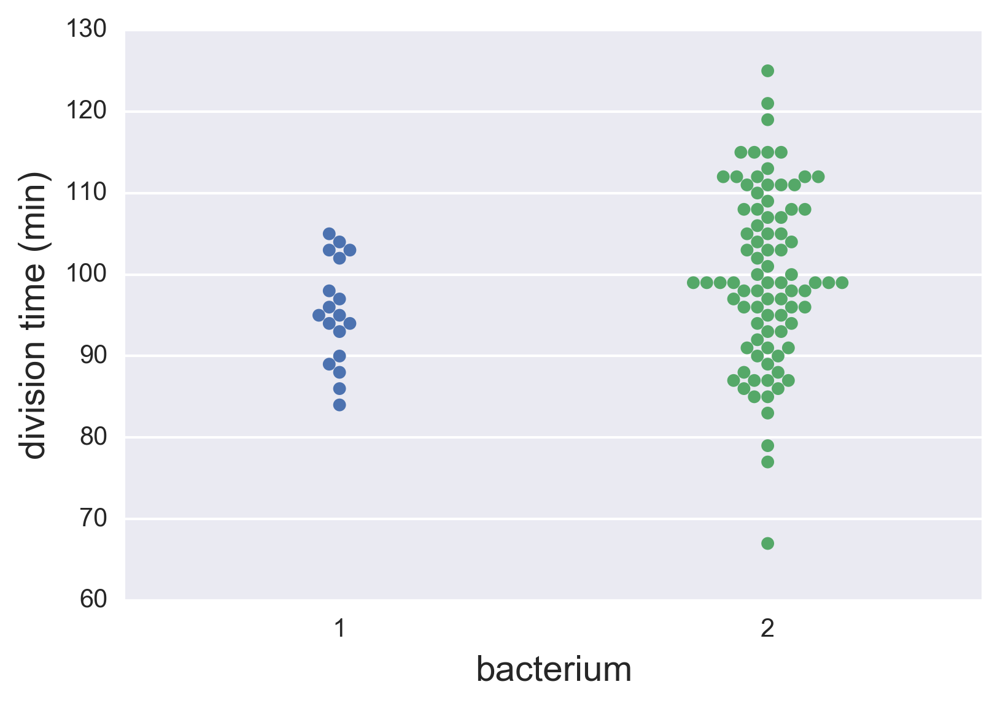

In [15]:
# Set up DataFrame with results
df = pd.DataFrame(columns=['bacterium', 'division time (min)'])
div_times_1 = np.diff(div_inds_1) * dt
div_times_2 = np.diff(div_inds_2) * dt
df['bacterium'] = np.concatenate((np.ones_like(div_times_1), 
                                  np.ones_like(div_times_2) * 2))
df['division time (min)'] = np.concatenate((div_times_1, div_times_2))

sns.swarmplot(x='bacterium', y='division time (min)', data=df);

The division times between the two seem to be similarly distributed, perhaps with bacterium 2 being more broadly distributed.  We have many more samples for bacterium 2, so we can say more about its distribution.  Let's look at the ECDF and see how it compares to a theoretical Gaussian.

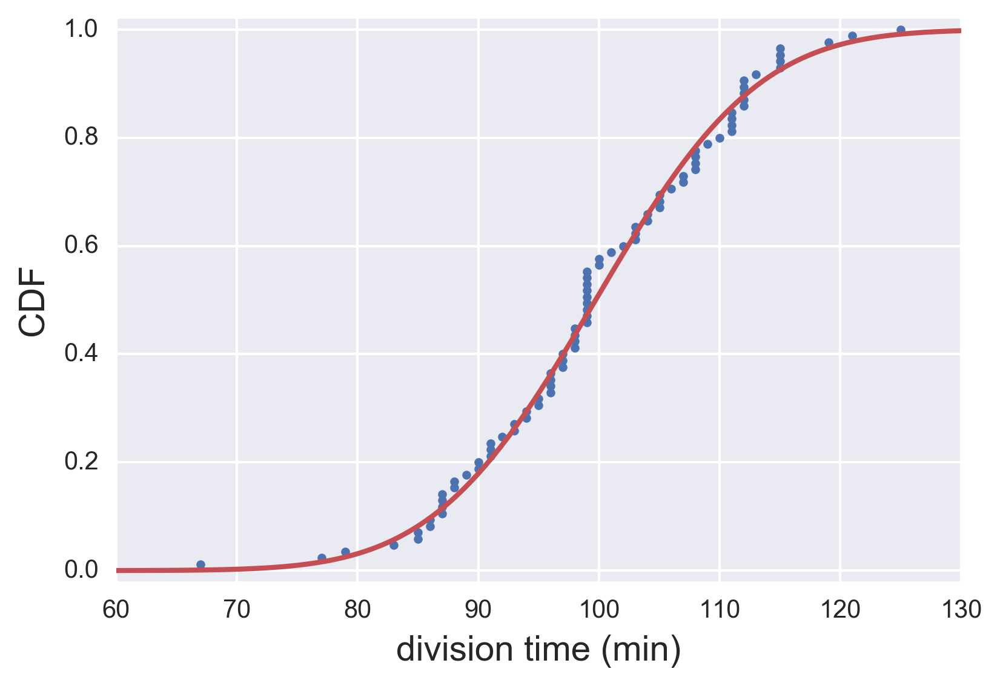

In [16]:
# Plot ECDF
plt.plot(*bebi103.ecdf(div_times_2), '.')

# Plot theoretical Gaussian CDF
t_smooth = np.linspace(60, 130, 300)
plt.plot(t_smooth, 
         st.norm.cdf(t_smooth, loc=div_times_2.mean(), scale=div_times_2.std()),
         '-', color=sns.color_palette()[2])

# Clean up plot
plt.xlabel('division time (min)')
plt.ylabel('CDF')
plt.margins(y=0.02)

So, the division times are approximately Gaussian distributed with a mean of about 100 minutes and a standard deviation of about 10 minutes.

**c)** To perform the parameter estimation and model selection, we will use PTMCMC using a hierarchical model.  The technique for PTMCMC for model selection was laid out in [Lecture 5](http://bebi103.caltech.edu/2016/lecture_notes/l05_ptmcmc.pdf) and hierarchical models were discussed in [Lecture 8](http://bebi103.caltech.edu/2016/lecture_notes/l08_hierarchical_models.pdf).  Specifically, we wish to compute the quantity $\ln Z_l(1) = P(M_l\mid D, I)$, which is the likelihood of model $M_l$, as laid out in that lecture.  For bacterium $i$, the growth curve before division event $j$ is described by

\begin{align}
\text{area}^\mathrm{theor}_{ij}(t) = a_{ij} + b_{ij} t
\end{align}

for a linear model and

\begin{align}
\text{area}^\mathrm{theor}_{ij}(t) = a_{ij}\mathrm{e}^{\kappa_{ij} t}
\end{align}

for an exponential model.  For simplicity in this theoretical treatment, we will consider the linear model, but the analysis is identical for the exponential model; just swap $b$'s for $\kappa$'s in what follows.

Bacterium $i$ has a characteristic growth rate $b_i$ and area immediately after division $a_i$.  *Caulobacter* in general have a characteristic growth rate $b$  and area $a$ under the conditions of this experiment.  We assume the growth rate for given *Caulobacter* cells is Gaussian distributed with variance $\sigma_b^2$, and we assume further that the growth rate between a given pair of sequential division events for mother cell $i$ is also Gaussian distributed with mean $b_i$ and variance $\sigma_{bi}^2$.  We similarly define $\sigma_{a}$ and $\sigma_{ai}$.  Thus, we have

\begin{align}
P(b_i\mid b, \sigma, I) &= \frac{1}{\sqrt{2\pi \sigma_b^2}}\,\mathrm{e}^{-(b_i-b)^2/2\sigma_b^2},\\[1em]
P(a_i\mid a, \sigma, I) &= \frac{1}{\sqrt{2\pi \sigma_a^2}}\,\mathrm{e}^{-(a_i-a)^2/2\sigma_a^2},
\end{align}

and

\begin{align}
P(b_{ij}\mid b_i, \sigma_{bi}, I) &= \frac{1}{\sqrt{2\pi \sigma_{bi}^2}}\,\mathrm{e}^{-(b_{ij}-b_i)^2/2\sigma_{bi}^2}, \\[1em]
P(a_{ij}\mid a_i, \sigma_{ai}, I) &= \frac{1}{\sqrt{2\pi \sigma_{ai}^2}}\,\mathrm{e}^{-(a_{ij}-a_i)^2/2\sigma_{ai}^2}.
\end{align}

For ease of notation, we denote the set of $a_{ij}$ as $\mathsf{A}$, the set of $b_{ij}$ as $\mathsf{B}$, the set of $a_i$ as $\mathbf{a}$, the set of $b_i$ as $\mathbf{b}$, the set of $\sigma_{bi}$ as $\boldsymbol{\sigma}_b$, and the set of $\sigma_{ai}$ as $\boldsymbol{\sigma}_a$. We can then write the respective portions of the prior as

\begin{align}
P(\mathbf{b}\mid b, \sigma_b, I) &= \prod_i \frac{1}{\sqrt{2\pi \sigma_b^2}}\,\mathrm{e}^{-(b_i-b)^2/2\sigma_b^2},\\[1em]
P(\mathbf{a}\mid a, \sigma_a, I) &= \prod_i \frac{1}{\sqrt{2\pi \sigma_a^2}}\,\mathrm{e}^{-(a_i-a)^2/2\sigma_a^2},
\end{align}

and

\begin{align}
P(\mathsf{B}\mid \mathbf{b}, \boldsymbol{\sigma}_b, I) &= \prod_i\prod_j \frac{1}{\sqrt{2\pi \sigma_{bi}^2}}\,\mathrm{e}^{-(b_{ij}-b_i)^2/2\sigma_{bi}^2},\\[1em]
P(\mathsf{A}\mid \mathbf{a}, \boldsymbol{\sigma}_a, I) &= \prod_i\prod_j \frac{1}{\sqrt{2\pi \sigma_{ai}^2}}\,\mathrm{e}^{-(a_{ij}-a_i)^2/2\sigma_{ai}^2}.
\end{align}

Next, to define our likelihood, we assume that each data point along the growth curve has some error about the predicted theoretical value that is Cauchy distributed.  We choose a Cauchy distribution because we know that we are likely to have some segmentation errors, often due to the presence of other cells in the field of view, and we do not want the outliers to overwhelm the regression.  We assume the same Cauchy scale parameter $\beta$ for all data points.  Thus, the likelihood is

\begin{align}
P(D\mid \mathsf{A}, \mathsf{B}, \beta, I) = 
\prod_{i}\prod_{j}\prod_k\left[\pi \beta \left(1+\left(\frac{\mathrm{area}_{ijk} - \mathrm{area}^\mathrm{theor}_{ij}(t_{ijk})}{\beta}\right)^2\right)\right]^{-1},
\end{align}

where the index $k$ goes over the time points for growth curve $j$ of bacterium $i$.

Then, we can write Bayes's Theorem for the parameter estimation problem as

\begin{align}
P(\mathsf{A}, \mathsf{B}, \mathbf{a}, \mathbf{b}, \boldsymbol{\sigma}_a, \boldsymbol{\sigma}_b, a, b, \beta \mid D, I) \propto 
&\;P(D\mid \mathsf{A}, \mathsf{B}, \beta, I) \\[1em]
&\times 
P(\mathsf{B}\mid \mathbf{b}, \boldsymbol{\sigma}_b, I)
P(\mathsf{A}\mid \mathbf{a}, \boldsymbol{\sigma}_a, I) \\[1em]
&\times 
\,P(\mathbf{b}\mid b,\sigma_b,I)
\,P(\mathbf{a}\mid a,\sigma_a,I) \\[1em]
&\times
P(b,I)
\,P(a,I)
\,P(\sigma_b,I)
\,P(\sigma_a,I)
\,P(\beta, I),
\end{align}

where the last three rows comprise the prior.  To finish specifying the problem, we need

\begin{align}
P(b,I) &= \frac{1}{b_\mathrm{max} - b_\mathrm{min}} \\[1em]
P(a,I) &= \frac{1}{a_\mathrm{max} - a_\mathrm{min}} \\[1em]
P(\sigma_b, I) &= \frac{1}{\sigma_b\ln(\sigma_{b,\mathrm{max}} / \sigma_{b,\mathrm{min}})} \\[1em]
P(\sigma_a, I) &= \frac{1}{\sigma_a\ln(\sigma_{a,\mathrm{max}} / \sigma_{a,\mathrm{min}})} \\[1em]
P(\beta, I) &= \frac{1}{\beta\ln(\beta_\mathrm{max} / \beta_\mathrm{min})},
\end{align}

where we have assumed uniform priors for the intercepts and growth rates and Jeffreys priors for the scale parameters $\sigma$ and $\beta$.

Let's code this monster up.  Of course, this little task of "coding the monster up" will take the bulk of the rest of this problem.  The first step is to make the data easier to access.  We want individual time points (always starting at zero at the division event) for each growth curve between divisions.  We will make a list of `DataFrame`s that have these data.

In [17]:
def make_dfs(t, areas, div_inds):
    """
    Create a list of DataFrames containing time/area data between successive
    division event.
    """
    # First division (ignore first time point because it's right before division
    data = np.array([t[1:div_inds[0]] - t[1], areas[1:div_inds[0]]]).T
    df_list = [pd.DataFrame(columns=['t', 'area'], data=data)]

    # Add growth curves for subsequent divisions
    for i, ind in enumerate(div_inds[:-1]):
        data = np.array([t[ind:div_inds[i+1]-1] - t[ind],
                         areas[ind:div_inds[i+1]-1]]).T
        df_list.append(pd.DataFrame(columns=['t', 'area'], data=data))
        
    return df_list

# Make the DataFrames
df_1 = make_dfs(t_1, areas_1, div_inds_1)
df_2 = make_dfs(t_2, areas_2, div_inds_2)

Now that we have these `DataFrame`s, we can conveniently plot all of the growth curves on top of each other.

In [18]:
def plot_traces(list_of_df_lists):
    # Set up tabs and plots
    tabs = [None, None]

    # Populate the tabs
    for i, df_list in enumerate(list_of_df_lists):
        # Create figure
        p = bokeh.plotting.figure(plot_width=650, plot_height=250,
                                  x_axis_label='time(s)',
                                  y_axis_label='cell area (sq µm)',
                                  tools='pan,box_zoom,wheel_zoom,reset')

        # Add glyphs
        for df in df_list:
            p.line(x=df.t, y=df.area, line_width=1)

        # Put in tab
        title = 'bacterium ' + str(i+1)
        tabs[i] = bokeh.models.widgets.Panel(child=p, title=title)

    # Assemble and show tabs
    return bokeh.models.widgets.Tabs(tabs=tabs)

# Make the plot
bokeh.io.show(plot_traces([df_1, df_2]))

We see the occasional obvious outliers due to segmentation issues.  One way to detect and correct these is to check to see if the data point lies within a factor from the average of some local time points.  Specifically, if the fractional difference of a given area is more than 20% of the local median, it is an outlier. This implies an unreasonable jump in growth/shrinkage of a bacterium.  Let's try correcting for this.

In [19]:
# Delete unreasonable jumps
window = 10
jump_thresh = 0.2

for df_list in [df_1, df_2]:
    for i, df in enumerate(df_list):
        # Compute rolling local median
        local_median = df.area.rolling(center=True, window=window).median()
        
        # Local median for ends
        local_median[:window//2] = df.area[:window].median()
        local_median[-window//2:] = df.area[-window:].median()
        
        # Compute fractional difference and 
        frac_diff = np.abs((df.area - local_median) / local_median)
        df.loc[frac_diff > jump_thresh, 'area'] = np.nan
        df_list[i] = df.dropna(how='any')
        
# Plot resulting traces
bokeh.io.show(plot_traces([df_1, df_2]))

This is much better, but we will still use a Cauchy likelihood to correct for possible outliers, since we don't entirely trust the segmentation.

We have nice `DataFrame`s to use when building our model, so we are in good shape.  Now, let's code the likelihood.  The parameter vector `p` is defined as a concatenation of flattened $\mathsf{A}$, flattened $\mathsf{B}$, $\mathbf{a}$, $\mathbf{b}$, $\boldsymbol{\sigma}_a$, $\boldsymbol{\sigma}_b$, $a$, $b$, $\sigma_a$, $\sigma_b$, and $\beta$.  In this case, we have only two bacteria, so the index $i$ only goes from zero to one.  If we have $d_1$ divisions for bacterium 1 and $d_2$ divisions for bacterium 2, we have have $2(n_1 + n_2) + 13$ total parameters.  In our case, $n_1 = 19$ and $n_2 = 86$, so we have 223 total parameters.

In [20]:
@numba.jit(nopython=True)
def unpack_prior(p, n_divisions):
    """
    Unpack parameters for the prior.
    
    n_divisions is a list of the number of curves for each bacterium.
    """
    # Total number of divisions, useful to have around.
    n_tot_divisions = n_divisions.sum()

    # Pull out a values
    a_div = p[:n_tot_divisions]

    # Pull out b or kappa values for each division
    bk_div = p[n_tot_divisions:2*n_tot_divisions]

    # Pull out a values for individual bacteria
    ind = 2*n_tot_divisions
    a_indiv = p[ind:ind+len(n_divisions)]
    
    # Pull out b/kappa values for individual bacteria
    ind += len(n_divisions)
    bk_indiv = p[ind:ind+len(n_divisions)]

    # Pull out sigma_a values for individual bacteria
    ind += len(n_divisions)
    sigma_a_indiv = p[ind:ind+len(n_divisions)]
    
    # Pull out sigma_b values for individual bacteria
    ind += len(n_divisions)
    sigma_bk_indiv = p[ind:ind+len(n_divisions)]

    # Pull out highest level hyperparameters
    a = p[-5]
    bk = p[-4]
    sigma_a = p[-3]
    sigma_bk = p[-2]

    # Pull out Cauchy scale parameter.
    beta = p[-1]

    return a_div, bk_div, a_indiv, bk_indiv, sigma_a_indiv, sigma_bk_indiv, \
                a, bk, sigma_a, sigma_bk, beta
    
    
@numba.jit(nopython=True)
def unpack_like(p, n_divisions):
    """
    Unpack parameters for likelihood calculation.
    """
    # Pull out a values
    n_total_divisions = n_divisions.sum()
    a_div = p[:n_total_divisions]
    b_div = p[n_total_divisions:2*n_total_divisions]
    beta = p[-1]
    
    return a_div, b_div, beta

Now that we can unpack the parameters, we can compute the log likelihood.  We first define the two theoretical functions we will use for the fits.

In [21]:
@numba.jit(nopython=True)
def linear_fun(t, a, b):
    return a + b * t

@numba.jit(nopython=True)
def exp_fun(t, a, kappa):
    return a * np.exp(kappa * t)

We also need to store the `DataFrames` as NumPys array to use Numba.  To do this, we concatenate all of the time points together, as well as the areas.  We store the indices where we have break points between growth curves. It is also convenient to store the number of divisions for each bacterium while we're at it.

In [22]:
# Specify our data sets
list_of_df_lists = [df_1, df_2]

# Get number of divisions
n_divisions = np.array([len(df_list) for df_list in list_of_df_lists])

# Make set of division times
t_list = [df.t.values for df_list in list_of_df_lists for df in df_list]
t = np.concatenate(t_list)
areas = np.concatenate([df.area.values for df_list in list_of_df_lists 
                              for df in df_list])
n_points = np.array([len(t) for t in t_list])
inds = np.concatenate(((0,), n_points.cumsum()))

Next, we define the log likelihood.  We take the parameter `bk` and other similarly named parameters to mean either the parameter $b_{ij}$ or $\kappa_{ij}$, since they can be used interchangeably, depending on the theoretical function we are using.

In [23]:
@numba.jit(nopython=True)
def cauchy_logpdf(x, mu, beta):
    """
    Log PDF of the Cauchy distribution.
    """
    return -len(x) * np.log(np.pi * beta) \
                    - np.sum(np.log(1.0 + ((x - mu) / beta)**2))

    
@numba.jit(nopython=True)
def log_likelihood_single_curve_linear(a, b, t, area, beta):
    """
    The log likelihood for a single growth curve.
    """
    area_theor = linear_fun(t, a, b)
    return cauchy_logpdf(area, area_theor, beta)


@numba.jit(nopython=True)
def log_likelihood_linear(p, t, areas, inds, n_divisions):
    """
    The log likelihood for all growth curves for all bacteria.
    """
    # Unpack parameters
    a_div, b_div, beta = unpack_like(p, n_divisions)
    
    log_like = 0.0
    for i in range(n_divisions.sum()):
        t_ = t[inds[i]:inds[i+1]]
        area_ = areas[inds[i]:inds[i+1]]
        log_like += log_likelihood_single_curve_linear(
                                        a_div[i], b_div[i], t_, area_, beta)
    return log_like


@numba.jit(nopython=True)
def log_likelihood_single_curve_exp(a, kappa, t, area, beta):
    """
    The log likelihood for a single growth curve.
    """
    area_theor = exp_fun(t, a, kappa)
    return cauchy_logpdf(area, area_theor, beta)


@numba.jit(nopython=True)
def log_likelihood_exp(p, t, areas, inds, n_divisions):
    """
    The log likelihood for all growth curves for all bacteria.
    """
    # Unpack parameters
    a_div, kappa_div, beta = unpack_like(p, n_divisions)
    
    log_like = 0.0
    for i in range(n_divisions.sum()):
        t_ = t[inds[i]:inds[i+1]]
        area_ = areas[inds[i]:inds[i+1]]
        log_like += log_likelihood_single_curve_exp(
                                        a_div[i], kappa_div[i], t_, area_, beta)
    return log_like

We also need to write functions for the log prior.  Because of all the parameters and the informative nature of the hyperparameters on the other parameters, this prior is far messier than the ones we are used to.  Furthermore, since we are using PTMCMC for model selection, we need to ensure that the prior is properly normalized.

In [24]:
@numba.jit(nopython=True)
def log_prior(p, n_divisions, a_range, bk_range, sigma_a_range, sigma_bk_range, 
              beta_range):
    """
    Properly normalized log prior.
    """
    # Everything must be positive
    if (p <= 0).any():
        return -np.inf
    
    # Unpack parameters
    a_div, bk_div, a_indiv, bk_indiv, sigma_a_indiv, sigma_bk_indiv, \
                a, bk, sigma_a, sigma_bk, beta = unpack_prior(p, n_divisions)
    
    # Check bounds on parameters
    if beta > beta_range[1] or beta < beta_range[0]:
        return -np.inf
    if a > a_range[1] or a < a_range[0] \
        or (a_indiv > a_range[1]).any() or (a_indiv < a_range[0]).any() \
        or (a_div > a_range[1]).any() or (a_div < a_range[0]).any():
        return -np.inf
    if bk > bk_range[1] or bk < bk_range[0] \
        or (bk_indiv > bk_range[1]).any() or (bk_indiv < bk_range[0]).any() \
        or (bk_div > bk_range[1]).any() or (bk_div < bk_range[0]).any():
        return -np.inf
    if sigma_a > sigma_a_range[1] or sigma_a < sigma_a_range[0]:
        return -np.inf
    if sigma_bk > sigma_bk_range[1] or sigma_bk < sigma_bk_range[0]:
        return -np.inf
    if (sigma_a_indiv > sigma_a_range[1]).any() or \
            (sigma_a_indiv < sigma_a_range[0]).any():
        return -np.inf
    if (sigma_bk_indiv > sigma_bk_range[1]).any() or \
            (sigma_bk_indiv < sigma_bk_range[0]).any():
        return -np.inf

    # Total number of divisions
    n_tot_divisions = n_divisions.sum()
    
    # Total number of cells
    n_cells = len(n_divisions)
        
    # Compute prior, first with uninformative parts
    log_prior = -np.log(a_range[1] - a_range[0])
    log_prior -= np.log(bk_range[1] - bk_range[0])
    log_prior -= np.log(sigma_a * np.log(sigma_a_range[1] / sigma_a_range[0]))
    log_prior -= np.log(sigma_bk * np.log(sigma_bk_range[1] / sigma_bk_range[0]))
    log_prior -= np.log(beta * np.log(beta_range[1] / beta_range[0]))

    # Compute informative parts from hierarchical model
    log_prior -= (n_cells + n_tot_divisions) * np.log(2 * np.pi)
    log_prior -= n_cells * np.log(sigma_a)
    log_prior -= n_cells * np.log(sigma_bk)
    log_prior -= np.sum((a_indiv - a)**2 / 2 / sigma_a**2)
    log_prior -= np.sum((bk_indiv - bk)**2 / 2 / sigma_bk**2)
    log_prior -= np.sum(n_divisions * np.log(sigma_a_indiv))
    log_prior -= np.sum(n_divisions * np.log(sigma_bk_indiv))

    ind_a = 0
    ind_bk = n_tot_divisions
    for i, n_div in enumerate(n_divisions):
        a_vals = a_div[ind_a:ind_a+n_div]
        log_prior -= np.sum((a_vals - a_indiv[i])**2 / 2 / sigma_a_indiv[i]**2)

        bk_vals = bk_div[ind_bk:ind_bk+n_div]
        log_prior -= np.sum((bk_vals - bk_indiv[i])**2 / 2 / sigma_bk_indiv[i]**2)
        
        ind_a += n_div
        ind_bk += n_div
        
    return log_prior

We now need to specify the ranges of the parameters to input into the prior.  We will take $10^{-3} < \beta < 1$ µm$^2$.  We choose the lower bound to be roughly the area corresponding to a single pixel (the smallest we can resolve), and the upper bound is absurdly high.  For the bounds on the intercept, we take our smallest and largest bacterium that we used in outlier detection, $1 < a < 3.5$ µm$^2$.  We take $0.01 < \sigma_{a}, \sigma_{ai} < 2$ µm$^2$.  For the bounds on the $b$'s and $\sigma_b$'s, we consider the slowest and fastest growth rates we might expect.  The fastest known bacterial growth rate is a division every 12 minutes, which would amount to growth of about 1 µm$^2$ in 12 minutes for *Caulobacter*.  For slow growth, we take the entire duration of the experiment, which was about a week, or 10$^5$ minutes.  So, we take  $10^{-5} < b, \sigma_{b}, \sigma_{bi} < 0.1$ µm$^2$/min.

In [25]:
# Specify bounds on parameters
a_range = (1, 3.5)
b_range = (1e-5, 0.1)
beta_range = (1e-3, 1)
sigma_a_range = (0.01, 2)
sigma_b_range = (1e-5, 0.1)

We will start our MCMC runs near the MAP.  To find a starting point near the MAP, we take the following strategy.

1. Guess the most probable values of the $\sigma_i$, $\sigma$, and $\beta$.
2. Fit each individual growth curve ignoring the hyperparameters to get an estimate for the most probable values of $a_{ij}$ and $b_{ij}$.
3. Estimate the most probable $b_i$ as the mean of the $b_{ij}$.
4. Estimate the most probable $b$ as the mean of the $b_i$.

To use optimization, we first need to define a function that is the negative log likelihood for a single curve.

In [26]:
@numba.jit(nopython=True)
def neg_log_likelihood_single_curve_linear(p, t, area, beta):
    return -log_likelihood_single_curve_linear(p[0], p[1], t, area, beta)

@numba.jit(nopython=True)
def neg_log_likelihood_single_curve_exp(p, t, area, beta):
    return -log_likelihood_single_curve_exp(p[0], p[1], t, area, beta)

Now we can do our optimization calculations.

In [27]:
# Guess beta
beta0 = 0.09   # µm^2

# Guess sigmas
sigma_a0 = 0.1  # µm^2
sigma_b0 = 0.001  # µm^2/min
sigma_a_indiv0 = sigma_a0 * np.ones(len(list_of_df_lists))
sigma_b_indiv0 = sigma_b0 * np.ones(len(list_of_df_lists))

# Perform linear regression on each curve
a_div0 = []
b_div0 = []
for i, df_list in enumerate(list_of_df_lists):
    a_div0.append(np.empty(n_divisions[i]))
    b_div0.append(np.empty(n_divisions[i]))
    for j, df in enumerate(df_list):
        args = (df.t.values, df.area.values, beta0)
        p0 = np.array([1.5, 1 / 100])
        res = scipy.optimize.minimize(neg_log_likelihood_single_curve_linear, 
                                      p0, args=args, method='powell')
        a_div0[i][j] = res.x[0]
        b_div0[i][j] = res.x[1]
        
# Compute the a's for each bacterium
a_indiv0 = np.empty(len(a_div0))
for i, a_ in enumerate(a_div0):
    a_indiv0[i] = a_.mean()

# Compute the b's for each bacterium
b_indiv0 = np.empty(len(b_div0))
for i, b_ in enumerate(b_div0):
    b_indiv0[i] = b_.mean()

# Compute hyperhyper a and b
a0 = a_indiv0.mean()
b0 = b_indiv0.mean()

# Put parameters together as initial guess for big problem
p0 = []
for a_div0_ in a_div0:
    p0 += list(a_div0_)
for b_div0_ in b_div0:
    p0 += list(b_div0_)
p0 += list(a_indiv0)
p0 += list(b_indiv0)
p0 += list(sigma_a_indiv0)
p0 += list(sigma_b_indiv0)
p0 += [a0, b0, sigma_a0, sigma_b0, beta0]
p0 = np.array(p0)

With a good starting point, we'll make perturbations from this starting point for our walkers.  Let's set everything up for MCMC.  First, we'll write a function to compute the evidence from a PTMCMC trace using numerical quadrature.

In [29]:
def lnZ(df_mcmc):
    """
    Compute log Z(1) from PTMCMC traces stored in DataFrame.
    """
    # Average the log likelihood over the samples
    log_mean = np.zeros(len(df_mcmc['beta_ind'].unique()))
    for i, b in enumerate(df_mcmc['beta_ind'].unique()):
        log_mean[i] = df_mcmc['lnlike'][df_mcmc['beta_ind']==b].mean()

    # Set of betas (temperatures)
    betas = np.concatenate((np.array(df_mcmc['beta'].unique()), (0,)))

    # Approximate quadrature
    return np.dot(log_mean, -np.diff(betas))

Before we begin this calculation let's think about its scale.  We have 217 variables and 1000 walkers at 20 temperatures.  That means we have 20,000 total walkers and they are traversing a 217-dimensional landscape at each temperature.  How long does it take to compute the posterior?

In [30]:
print('Time to compute log prior:')
%timeit log_prior(p0, n_divisions, a_range, b_range, sigma_a_range, sigma_b_range, beta_range)

print('\nTime to compute log_likelihood:')
%timeit log_likelihood_linear(p0, t, areas, inds, n_divisions)

Time to compute log prior:
The slowest run took 230595.29 times longer than the fastest. This could mean that an intermediate result is being cached.
1 loop, best of 3: 7.49 µs per loop

Time to compute log_likelihood:
The slowest run took 1854.74 times longer than the fastest. This could mean that an intermediate result is being cached.
1 loop, best of 3: 179 µs per loop


It takes about 190 µs to compute the posterior, mostly in the log likelihood. So, for 20 temperatures and 1000 walkers, a single step takes about 4 seconds just in the calculation of the posterior.  Now, if we take a total of 4000 steps (2000 burn-in and 2000 sampling), this amounts to 15,000 seconds, or just more than 4 hours on the posterior calculations. I tried this without optimizing (no Numba-ing, using `DataFrames`), and each posterior evaluation took about 4 ms. This means the calculation would take about 20 times longer, or about 80 hours. So, the optimization is definitely worth it!

Now, there is another problem with this large calculation.  After burn in, we will have 1000 walkers sampling 2000 steps and 20 temperatures, so we will have four million samples.  Each sample has 217 parameters, giving us about 9 billion samples.  Each sample is a 64 bit float, occupying 8 bytes of memory.  This amounts to about 70 billion bytes, or 70 GB of memory.  Clearly, we cannot store the entire trajectory in RAM.

We do not need to store the samples from all temperatures, just the cold one.  To compute $\ln Z(1)$ for model selection, we need only to have the $\beta$ values and the log likelihoods at the various temperatures.  Therefore, we will take the following approach.

1. Perform burn-in.
2. Sample 20 steps.
3. Dump the cold samples and the log probabilities to a CSV file on disk.
4. Goto 2 until we have 1000 samples.

This is convenient because it also allows us to see progress.

Now, we'll set up the PTMCMC calculation, specifying where the walkers start, how many steps, etc.

In [31]:
# Sampler setup
n_walkers = 1000
n_burn = 1000
n_steps = 1000
n_temps = 20
n_store = 20

# Arguments for prior and likelihood
logpargs = (n_divisions, a_range, b_range, sigma_a_range, sigma_b_range, 
              beta_range)
loglargs = (t, areas, inds, n_divisions)

p0_walkers = np.empty((n_temps, n_walkers, len(p0)))
for i in range(n_temps):
    for j in range(n_walkers):
        p0_walkers[i, j,:] = p0 + 0.05 * p0 * np.random.uniform(-1, 1, len(p0))

cols = ['a_{0:d}_{1:d}'.format(i, j) for i in range(len(list_of_df_lists))
                                        for j in range(n_divisions[i])]
cols += ['b_{0:d}_{1:d}'.format(i, j) for i in range(len(list_of_df_lists)) 
                                        for j in range(n_divisions[i])]
cols += ['a_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['b_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['sigma_a_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['sigma_b_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['a', 'b', 'sigma_a', 'sigma_b', 'beta_cauchy']

Now, to run the PTMCMC, we'll write a convenient function to do it.  We will try to load the results, and if that fails, run the MCMC calculation.

In [32]:
def get_mcmc_results(mcmc_file, lnZ_file, log_like_fun, logpargs, loglargs,
                     p0_walkers, cols, n_walkers=1000, n_burn=1000, n_steps=1000, 
                     n_temps=20, n_store=20):
    """
    Either load results or perform MCMC.
    """
    try:
        # Load cold chain
        df_mcmc = pd.read_csv(mcmc_file)

        # Load what we need to compute lnZ
        df_lnZ = pd.read_csv(lnZ_file)
        lnZ_val = lnZ(df_lnZ)
    except:
        # Report progress
        print('Computing burn-in and steps 0 through {0:d}...'.format(n_store),
              flush=True)

        # Run burn-in and first set of samples
        df_mcmc, p0_walkers = bebi103.run_pt_emcee(
            log_like_fun, log_prior, n_burn, n_store, n_temps=n_temps, 
            p0=p0_walkers, columns=cols, loglargs=loglargs, logpargs=logpargs, 
            return_pos=True)

        # Store cold chain
        inds = df_mcmc['beta_ind'] == 0
        df_mcmc[inds].to_csv(mcmc_file, float_format='%.6e', index=False)

        # Store what we need to compute lnZ
        df_mcmc[['beta_ind', 'beta', 'lnlike']].to_csv(
            lnZ_file, float_format='%.6e', index=False)

        # Keep count of how many samples we've gotten
        n_samples = n_store

        # Run the rest
        while n_samples < n_steps:
            print('Computing steps {0:d} through {1:d}...'.format(
                    n_samples, n_samples + n_store), flush=True)

            # Run burn-in and first set of samples
            df_mcmc, p0_walkers = bebi103.run_pt_emcee(
                log_like_fun, log_prior, 0, n_store, n_temps=n_temps, 
                p0=p0_walkers, columns=cols, loglargs=loglargs, 
                logpargs=logpargs, return_pos=True)

            # Store cold chain
            inds = df_mcmc['beta_ind'] == 0
            df_mcmc[inds].to_csv(mcmc_file, float_format='%.6e', index=False, 
                                 mode='a', header=False)

            # Store what we need to compute lnZ
            df_mcmc[['beta_ind', 'beta', 'lnprob']].to_csv(
                lnZ_file, float_format='%.6e', index=False, mode='a',
                header=False)

            # Keep count of how many samples we've gotten
            n_samples += n_store
            
        # Load cold chain
        df_mcmc = pd.read_csv(mcmc_file)

        # Load what we need to compute lnZ
        df_lnZ = pd.read_csv(lnZ_file)
        lnZ_val = lnZ(df_lnZ)
            
    return df_mcmc, lnZ_val

Now that we have that convenient function, let's run it.

In [ ]:
# Specify file names
mcmc_file = 'hw9_mcmc_linear.csv'
lnZ_file = 'hw9_mcmc_linear_lnZ.csv'

# Let 'er rip
df_mcmc, lnZ_linear = get_mcmc_results(
    mcmc_file, lnZ_file, log_likelihood_linear, logpargs, loglargs, p0_walkers, 
    cols,  n_walkers=n_walkers, n_burn=n_burn, n_steps=n_steps, n_temps=n_temps)

Computing burn-in and steps 0 through 20...


Now that we have all of our samples, we can plot the results.

In [33]:
def plot_fits(list_of_df_lists, df_mcmc, div_inds_list, t_points_list, 
              areas_list, theor_fun, bk_str):
    # Set up tabs and plots
    tabs = [None for i in range(len(list_of_df_lists))]

    # Populate the tabs
    for i, df_list in enumerate(list_of_df_lists):
        # Create figure
        p = bokeh.plotting.figure(plot_width=650, plot_height=250,
                                  x_axis_label='time(s)',
                                  y_axis_label='cell area (sq µm)',
                                  tools='pan,box_zoom,wheel_zoom,reset')

        # Add glyphs
        p.circle(t_points_list[i], areas_list[i], size=3)
        t_start = np.concatenate(((t_points_list[i][1],), 
                                   t_points_list[i][div_inds_list[i]]))
        for j, di in enumerate(div_inds_list[i]):
            t_plot = np.linspace(t_start[j], t_points_list[i][di-1], 200)
            a = df_mcmc['a_' + str(i) + '_' + str(j)].mean()
            bk = df_mcmc[bk_str + '_' + str(i) + '_' + str(j)].mean()
            a_theor = theor_fun(t_plot - t_plot[0], a, bk)
            p.line(t_plot, a_theor, color='cyan', line_width=2)    

        # Put in tab
        title = 'bacterium ' + str(i+1)
        tabs[i] = bokeh.models.widgets.Panel(child=p, title=title)
        
    return bokeh.models.widgets.Tabs(tabs=tabs)

# Make the plot
bokeh.io.show(plot_fits(list_of_df_lists, df_mcmc, [div_inds_1, div_inds_2],
                        [t_1, t_2], [areas_1, areas_2], linear_fun, 'b'))

And now let's look at a corner plot of the most relevant parameters and hyperparameters.

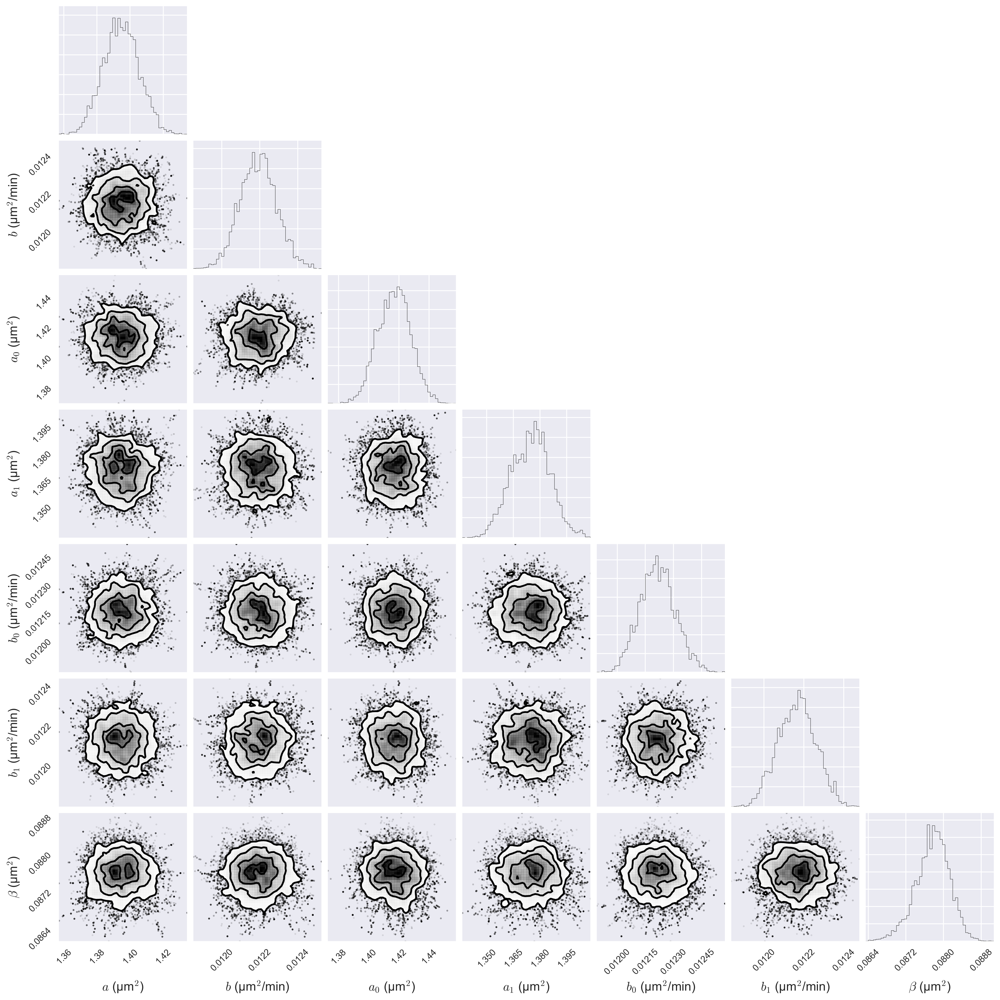

In [34]:
cols_to_plot = ['a', 'b', 'a_0', 'a_1', 'b_0', 'b_1', 'beta_cauchy']
corner.corner(df_mcmc[cols_to_plot], bins=50, smooth=1,
              labels=('$a$ (µm$^2$)',
                      '$b$ (µm$^2$/min)',
                      '$a_0$ (µm$^2$)',
                      '$a_1$ (µm$^2$)',
                      '$b_0$ (µm$^2$/min)',
                      '$b_1$ (µm$^2$/min)',
                       r'$\beta$ (µm$^2$)'));

The posterior seems to be sharply peaked.  The fact that the mean of the samples gave good curve fits for the traces indicates that the posterior is nicely, symmetrically peaked.  We can verify this by noting that the MAP and mean are close.

In [35]:
# DataFrame to hold MAP and mean
df_map_mean_linear = pd.DataFrame(columns=['MAP', 'mean'])

# Compute MAP
map_ind = np.argmax(df_mcmc['lnprob']) 
df_map_mean_linear['MAP'] = df_mcmc.loc[map_ind, :]

# Compute mean
df_map_mean_linear['mean'] = df_mcmc.mean()

# Take a look
df_map_mean_linear.loc[df_map_mean_linear.index[:-5],:]

,MAP,mean
a_0_0,1.243063,1.249218
a_0_1,1.279653,1.287489
a_0_2,1.299450,1.295242
a_0_3,1.296988,1.302302
a_0_4,1.387647,1.379234
a_0_5,1.589196,1.578345
a_0_6,1.614114,1.622186
a_0_7,1.526885,1.526176
a_0_8,1.404926,1.401216
a_0_9,1.439371,1.437693


We see that the characteristic growth rate is about 0.0126 µm$^2$/min.  Importantly, we have saved $\ln Z$, which we can use to compare to the exponential model.  Let's compute that now.  First, we'll specify the range on the new parameter $\kappa$.

In [36]:
# Specify bounds on parameters
kappa_range = np.array(b_range) / np.array(a_range)
sigma_kappa_range = sigma_b_range

Next, we'll get our guess for the MAP.

In [37]:
# Guess sigmas
sigma_kappa0 = 0.001  # µm^2/min
sigma_kappa_indiv0 = sigma_kappa0 * np.ones(len(list_of_df_lists))

# Perform exponential regression on each curve
a0 = []
kappa_div0 = []
for i, df_list in enumerate(list_of_df_lists):
    a0.append(np.empty(n_divisions[i]))
    kappa_div0.append(np.empty(n_divisions[i]))
    for j, df in enumerate(df_list):
        args = (df.t.values, df.area.values, beta0)
        p0 = np.array([1.5, 1 / 100])
        res = scipy.optimize.minimize(neg_log_likelihood_single_curve_exp, 
                                      p0, args=args, method='powell')
        a_div0[i][j] = res.x[0]
        kappa_div0[i][j] = res.x[1]

# Compute the a's for each bacterium
a_indiv0 = np.empty(len(a_div0))
for i, a_ in enumerate(a_div0):
    a_indiv0[i] = a_.mean()

# Compute the b's for each bacterium
kappa_indiv0 = np.empty(len(kappa_div0))
for i, kappa_ in enumerate(kappa_div0):
    kappa_indiv0[i] = kappa_.mean()

# Compute hyperhyper a and b
a0 = a_indiv0.mean()
kappa0 = kappa_indiv0.mean()

# Put parameters together as initial guess for big problem
p0 = []
for a_div0_ in a_div0:
    p0 += list(a_div0_)
for kappa_div0_ in kappa_div0:
    p0 += list(kappa_div0_)
p0 += list(a_indiv0)
p0 += list(kappa_indiv0)
p0 += list(sigma_a_indiv0)
p0 += list(sigma_kappa_indiv0)
p0 += [a0, kappa0, sigma_a0, sigma_kappa0, beta0]
p0 = np.array(p0)

Now let's set up our sampler.

In [ ]:
# Arguments for prior and likelihood
logpargs = (n_divisions, a_range, kappa_range, sigma_a_range, sigma_kappa_range, 
            beta_range)
loglargs = (t, areas, inds, n_divisions)

p0_walkers = np.empty((n_temps, n_walkers, len(p0)))
for i in range(n_temps):
    for j in range(n_walkers):
        p0_walkers[i, j,:] = p0 + 0.05 * p0 * np.random.uniform(-1, 1, len(p0))

cols = ['a_{0:d}_{1:d}'.format(i, j) for i in range(len(list_of_df_lists))
                                        for j in range(n_divisions[i])]
cols += ['kappa_{0:d}_{1:d}'.format(i, j) for i in range(len(list_of_df_lists)) 
                                        for j in range(n_divisions[i])]
cols += ['a_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['kappa_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['sigma_a_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['sigma_kappa_{0:d}'.format(i) for i in range(len(list_of_df_lists))]
cols += ['a', 'kappa', 'sigma_a', 'sigma_kappa', 'beta_cauchy']

And now let's let PTMCMC do its thing!

In [ ]:
# File names
mcmc_file = 'hw9_mcmc_exp.csv'
lnZ_file = 'hw9_mcmc_exp_lnZ.csv'

# Let 'er rip
df_mcmc, lnZ_exp = get_mcmc_results(
    mcmc_file, lnZ_file, log_likelihood_exp, logpargs, loglargs, p0_walkers, 
    cols,  n_walkers=n_walkers, n_burn=n_burn, n_steps=n_steps, n_temps=n_temps)

Computing burn-in and steps 0 through 50...
Computing steps 50 through 100...
Computing steps 100 through 150...
Computing steps 150 through 200...
Computing steps 200 through 250...
Computing steps 250 through 300...
Computing steps 300 through 350...
Computing steps 350 through 400...
Computing steps 400 through 450...
Computing steps 450 through 500...
Computing steps 500 through 550...
Computing steps 550 through 600...
Computing steps 600 through 650...


We'll make similar plots of the fits for the exponential model.

In [ ]:
# Make the plot
bokeh.io.show(plot_fits(list_of_df_lists, df_mcmc, [div_inds_1, div_inds_2],
                        [t_1, t_2], [areas_1, areas_2], exp_fun, 'kappa'))

And we can also make a corner plot of the hyperparameters of interest.

In [ ]:
cols_to_plot = ['a', 'kappa', 'a_0', 'a_1', 'kappa_0', 'kappa_1', 'beta_cauchy']
corner.corner(df_mcmc[cols_to_plot], bins=50, labels=('$a$ (µm$^2$)',
                                                      '$\kappa$ (1/min)',
                                                      '$a_0$ (µm$^2$)',
                                                      '$a_1$ (µm$^2$)',
                                                      '$\kappa_0$ (1/min)',
                                                      '$\kappa_1$ (1/min)',
                                                       r'$\beta$ (µm$^2$)'));

Again, we can glance at the MAP and mean values.

In [ ]:
# DataFrame to hold MAP and mean
df_map_mean_exp = pd.DataFrame(columns=['MAP', 'mean'])

# Compute MAP
map_ind = np.argmax(df_mcmc['lnprob']) 
df_map_mean_exp['MAP'] = df_mcmc.loc[map_ind, :]

# Compute mean
df_map_mean_exp['mean'] = df_mcmc.mean()

# Take a look
df_map_mean_exp.loc[df_map_mean_exp.index[:-5],:]

We again see a nicely peaked posterior.  The characteristic growth rate for these *Caulobacter* is about 0.006 min$^{-1}$.

And now it is time for the moment of truth.  Which model is more probable?  We have done all the work of computing the evidence so now we have to look at the difference in the $\ln Z(1)$ values.

In [ ]:
print('Odds ratio linear/exponential: ', np.exp(lnZ_linear - lnZ_exp))

So, the exponential model is overwhelmingly more likely, about $10^{163}$ times as likely!

<br />
<br />

### Problem 9.2: Your eyes are not as good as your computer, 5 pts

Download the image below.  Use the basic image processing tools we learned in class to replace the beige and magenta colors with white and save the resulting image.  Display the original image and the altered image side by side.  (This problem was inspired by Dan White.)

[<img src="swirl.png">](http://bebi103.caltech.edu/2015/data/swirl.png)

### Problem 9.2: solution
To pull out the beige and magenta, we will remove any pixel that has red color.

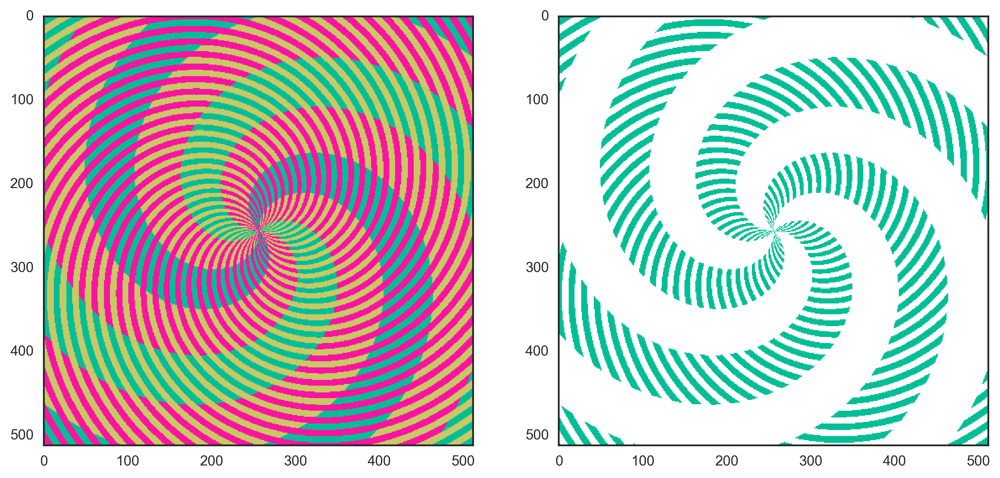

In [3]:
im = skimage.io.imread('../data/swirl.png')

# Strip beige and magenta
im_stripped = im.copy()
im_stripped[im[:,:,0] > 0] = 255

# Show result
with sns.axes_style('white'):
    fig, ax = plt.subplots(1, 2, figsize=(12,8))
    ax[0].imshow(im)
    ax[1].imshow(im_stripped)

Yes, that is right.  There are only three colors in the image: beige, magenta, and aqua blue.  You computer can "see" this, but your brain gets confused.

<br />

### Problem 9.3: $\sigma$ factor activity, 30 pts extra credit

In this problem, we will fully work up the data we studied in [Tutorial 9b](http://bebi103.caltech.edu/2016/protected/tutorials/t9b_segmentation.html). You can download the data set [here](https://www.dropbox.com/s/wy1ha6epss6yl3a/park_et_al.zip?dl=0). We will consider all images starting with `snaps001`, `snaps002`, and `snaps003`. Be sure to read the `README.pdf` file from Jin Park describing the data set.

**a)** Segment all images using the RFP channel, and then compute the mean intensity of each bacterium in the CFP and YFP channels. Show a representative segmentation (one each for the `001`, `002`, and `003` sets) by overlaying your binary segmented image on a phase image.

**b)** As discussed in class, we are not entirely sure of how to analyze the correlation or lack thereof of the two different σ factors. Generate plots that you think may be useful and/or develop metrics for correlation among the samples. This question is very open-ended and is your chance to experience thinking about real results with the members of your group.

### Problem 9.3: solution
**a)** We perform the segmentation as in Tutorial 9b using a Laplacian of Gaussian filter.  We start by defining functions based on that tutorial.  We will segment and label the images.

In [4]:
def log_segmentation(im, gauss_std=2.0, zero_crossing_thresh=0.00001, 
                     min_size=100, border_buffer=5):
    """
    Perform Laplacian of Gaussian segmentation and label result.
    
    Parameters
    ----------
    im : ndarray
        Image to segment
    gauss_std : float
        Standard deviation for Gaussian filter in units of pixels
    zero_crossing_threshold : float
        Threshold for edge detection of filtered image using zero-crossings
    min_size : int
        Minimal area of a blob to be considered a bacterium in units
        of pixels
    border_buffer : int
        Buffer around border for clearing border objects.
    """

    # Be sure image is a float
    im_float = skimage.img_as_float(im)

    # Compute LoG filter
    im_LoG = scipy.ndimage.filters.gaussian_laplace(im_float, gauss_std)

    # Find zero-crossings
    im_edge = zero_crossing_filter(im_LoG, zero_crossing_thresh)

    # Skeletonize edges
    im_edge = skimage.morphology.skeletonize(im_edge)

    # Fill holes
    im_bw = scipy.ndimage.morphology.binary_fill_holes(im_edge)

    # Remove small objectes that are not bacteria
    im_bw = skimage.morphology.remove_small_objects(im_bw, min_size=min_size)

    # Clear border with large buffer size b/c LoG procedure came off border
    im_bw = skimage.segmentation.clear_border(im_bw, buffer_size=border_buffer)

    # Label binary image; backward kwarg says value in im_bw to consider backgr.
    return skimage.measure.label(im_bw, background=0)


def zero_crossing_filter(im, thresh):
    """
    Returns image with 1 if there is a zero crossing and 0 otherwise.
    
    thresh is the the minimal value of the gradient, as computed by Sobel
    filter, at crossing to count as a crossing.
    """
    # Square structuring element
    selem = skimage.morphology.square(3)
    
    # Do max filter and min filter
    im_max = scipy.ndimage.filters.maximum_filter(im, footprint=selem)
    im_min = scipy.ndimage.filters.minimum_filter(im, footprint=selem)
    
    # Compute gradients using Sobel filter
    im_grad = skimage.filters.sobel(im)
    
    # Return edges
    return (((im >= 0) & (im_min < 0)) | ((im <= 0) & (im_max > 0))) \
                & (im_grad >= thresh)

We can now proceed to segment all of the images.  I have the images stored in the `../data/park_et_al/` directory on my machine.

In [5]:
# Define prefixes of images we are interested in
prefixes = ('snaps001', 'snaps002', 'snaps003')

# Directory containing images
image_dir = '../data/park_et_al/'

# Set up dictionary to hold labeled images and region props
results = dict()

# Loop through various prefixes
for prefix in prefixes:
    # Get list of all RFP images
    rfp_ims = glob.glob(image_dir + prefix + '*r.tif')
    cfp_ims = glob.glob(image_dir + prefix + '*c.tif')
    yfp_ims = glob.glob(image_dir + prefix + '*y.tif')
    
    # Create lists to store segmented images and region props
    segmented_images = []
    cfp_props = []
    yfp_props = []
    
    # Segment each and put labeled image in list
    for r_fname, c_fname, y_fname in zip(rfp_ims, cfp_ims, yfp_ims):
        # Read in images
        im = skimage.io.imread(r_fname)
        im_c = skimage.io.imread(c_fname)
        im_y = skimage.io.imread(y_fname)

        # Upsample to match segmentation
        im_c = scipy.ndimage.zoom(im_c, 2, order=0)
        im_y = scipy.ndimage.zoom(im_y, 2, order=0)

        # Perform segmentation
        im_labeled = log_segmentation(im)
        segmented_images.append(im_labeled)
        
        # Get the region props
        cfp_props.append(skimage.measure.regionprops(im_labeled, 
                                                     intensity_image=im_c))
        yfp_props.append(skimage.measure.regionprops(im_labeled, 
                                                     intensity_image=im_y))

    # Store the list of images and props in a dictionary
    results[prefix] = {'segmented_images': segmented_images,
                       'cfp_props': cfp_props,
                       'yfp_props': yfp_props}

We are now done with segmentation and labeling, so we will display representative images by overlaying the first image for each condition with a segmented image.

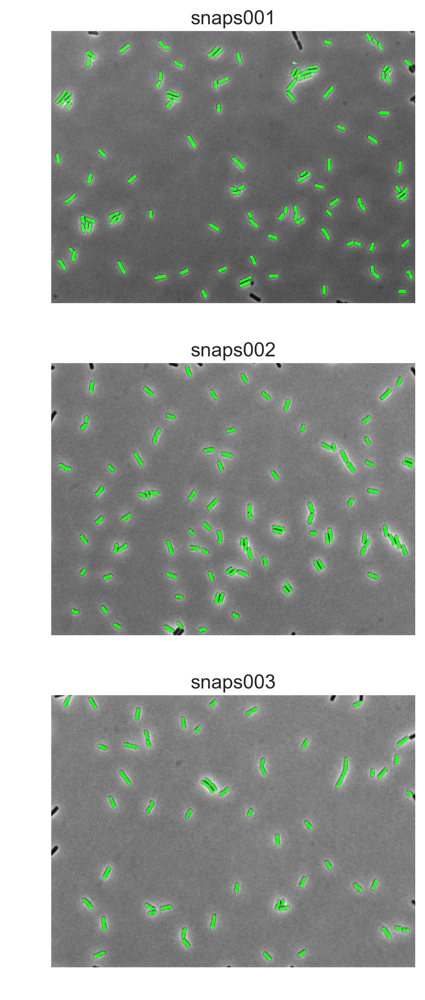

In [11]:
# Define function for showing overlay
def overlay_segmentation(ax, im, im_labeled):
    """
    Overlay im_labeled of im.
    """
    # Convert phase image to float RGB
    im_float = (im.astype(float) - im.min()) / (im.max() - im.min())

    # Saturate green channel
    im_g = np.copy(im_float)
    im_g[im_labeled>0] = 1

    # Build RGB image
    im_rgb = np.dstack((im_float, im_g, im_float))

    # Display image
    ax.imshow(im_rgb)
    
# Set up figure
fig, ax = plt.subplots(3, 1, figsize=(20,10))

# Display results
for i, prefix in enumerate(prefixes):
    # Load and upsample phase image
    im_p = skimage.io.imread(image_dir + prefix + '-001-p.tif')
    im_p = scipy.ndimage.zoom(im_p, 2, order=0)

    # Fetch labeled image
    im_labeled = results[prefix]['segmented_images'][0]
    
    # Display result
    overlay_segmentation(ax[i], im_p, im_labeled)
    
    # Title
    ax[i].set_title(prefix)
    ax[i].axis('off')
plt.tight_layout()

Finally, for use in part (b), we will extract the mean intensities of each bacterium in the CFP and YFP channels.  This will be a single NumPy array for each that we will assemble into a `DataFrame` that is indexed by the number of the image we took.

In [12]:
# Create dictionary for holding DataFrames with mean intensities
mean_int = dict()

# Loop throgh scans
for prefix in prefixes:
    cfp = []
    im_id = []
    for i, prop_list in enumerate(results[prefix]['cfp_props']):
        for prop in prop_list:
            cfp.append(prop.mean_intensity)
            im_id.append(i+1)

    yfp = []
    for prop_list in results[prefix]['yfp_props']:
        for prop in prop_list:
            yfp.append(prop.mean_intensity)
            
    # Put results in dictionary
    data_dict = {'cfp': np.array(cfp), 'yfp': np.array(yfp),
                        'im_id': np.array(im_id)}
    
    # Convert dictionary into a pandas DataFrame stored in mean_int dictionary
    mean_int[prefix] = pd.DataFrame(data_dict, data_dict['im_id'],
                                    columns=['cfp', 'yfp'])

**b)** Now that we have the mean intensities, we can plot them.  Because extreme values can be deceptive when there is a lot of overlap at more moderate values, we use transparency in the points in the scatter plot.

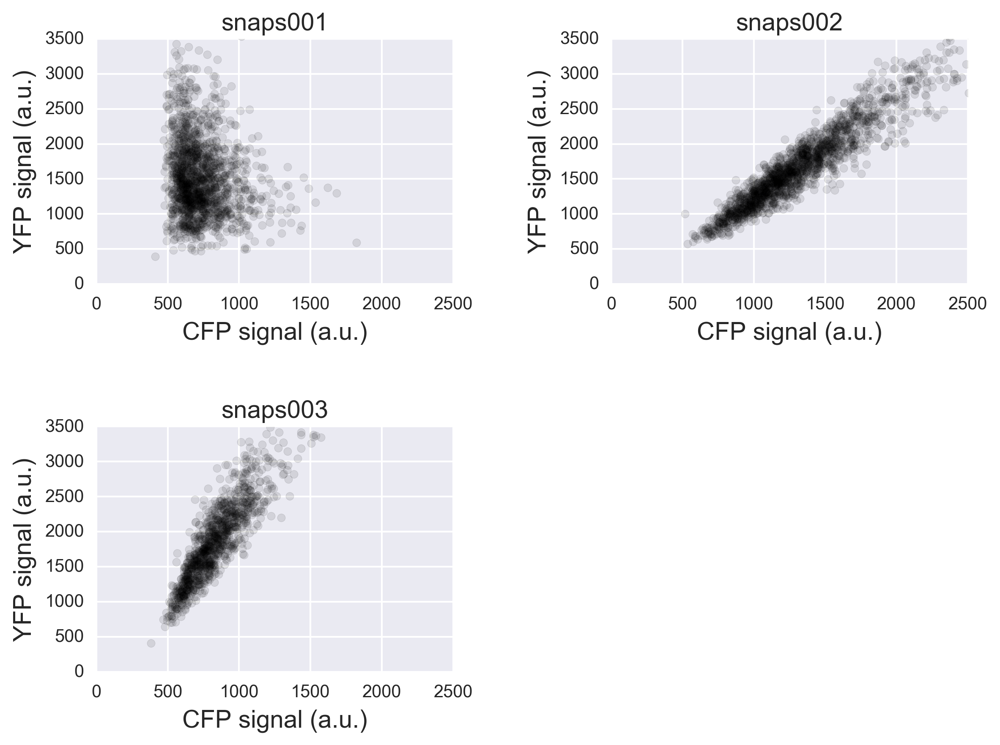

In [13]:
# Make scatter plots with some transparency to see dots
fig, ax = plt.subplots(2, 2, figsize=(8, 6))
inds = [(0, 0), (0, 1), (1, 0)]
for i, prefix in enumerate(prefixes):
    ax[inds[i]].scatter(mean_int[prefix].cfp, mean_int[prefix].yfp, alpha=0.1,
                        c='black')
    ax[inds[i]].set_title(prefix)
    ax[inds[i]].set_xlabel('CFP signal (a.u.)')
    ax[inds[i]].set_ylabel('YFP signal (a.u.)')
    
    ax[inds[i]].set_xlim((0, 2500))
    ax[inds[i]].set_ylim((0, 3500))

# Tidy up plot
ax[1,1].axis('off')
fig.tight_layout(w_pad=3, h_pad=3)

Recall that `snaps002` and `snaps003` are the control experiments where $\sigma_B$ and $\sigma_W$, respectively, have both a CFP and YFP fluorescent reporter.  We would expect strong correlation between the two. Eyeballing the plots, this seems to be the case, as the data points show a striking diagonal pattern.  (The off-diagonal spread is due to intrinsic noise, an important concept in studying gene expression regulation.)  In particular, when we have very high CFP signal, we also have very high YFP signal, indicating that both the CFP and YFP are reporting high activity of the sigma factor.

The data set with the label `snaps001` has a CFP reporter for $\sigma_B$ and a YFP reporter for $\sigma_W$.  We don't see the striking correlation that we saw in the controls.  Furthermore, when CFP signal is high, the YFP signal is close to the average CFP signal, and vice versa.  This does not necessarily indicate anticorrelation, but possible *independence* of the two sigma factors.

We should try to estimate the fraction of measurements that are in the extreme to get a handle on this.  In all samples, roughly 10 to 20 bacteria exhibit very high signal.  How many total bacteria were sampled?  We have that information!

In [14]:
# Print number of bacteria samples for each
for prefix in prefixes:
    print(prefix, ': ', len(mean_int[prefix]))

snaps001 :  1563
snaps002 :  1738
snaps003 :  1091


So, only about 1% of the bacteria sampled show extreme intensity.  That means that if $\sigma_B$ and $\sigma_W$ were completely uncorrelated, we would expect about 0.01% of the samples to show high signal in both $\sigma_B$ and $\sigma_W$, which amounts to less than one bacterium in those we sampled.  So, the fact that we do not see any bacteria that have high signal in $\sigma_B$ and $\sigma_W$ is not necessarily indicative of anticorrelation, but is indicative of independence of the two sigma factors.

Now, we would like to understand the distributions of values we would expect from the respective configurations.  In other words, we wish to evaluate $P(c, y \mid D_\text{config})$, the probability of observing CFP/YFP signals given our data for each configuration where the configurations are defined as

1. $\sigma_B$-CFP/$\sigma_W$-YFP (`snaps001`)
2. $\sigma_B$-CFP/$\sigma_B$-YFP (`snaps002`)
3. $\sigma_W$-CFP/$\sigma_W$-YFP (`snaps003`)

Specifically, we wish to compare $P(c \mid D_1)$ and $P(c \mid D_2)$, or whether or not the probability distributions describing the CFP signal under control of $\sigma_B$ are different due to the presence or absence of $\sigma_W$.  We similarly want to compare $P(y \mid D_1)$ and $P(y \mid D_3)$.

The problem is that we do not know what the probability distribution is; we only have samples from it.  We could assume a distribution and then compute the parameters that most likely describe it.  We may choose a bivariate Gaussian distribution for the controls (`snaps002` and `snaps003`), for example, and this probably would not be a bad choice.  We could do the same for `snaps001`, but it is not so clear that a Gaussian would be the best choice here.  

Instead, we will use a *nonparametric* technique for estimating probability distributions from samples, **kernel density estimation**, or KDE.  Specifically, if we have $n$ measurements $x_i$ drawn from an unknown probability distribution $P(x)$, the kernel density estimate for $P(x)$ is

\begin{align}
P(x) \approx \frac{1}{n\lambda}\sum_{i=1}^n K\left(\frac{x-x_i}{\lambda}\right),
\end{align}

where $K$ is the kernel and $\lambda$ is the bandwidth.  With this definition, the integral of the kernel over its support must evaluate to unity, and the kernel must have zero mean.

We will perform two-dimensional KDE on our three sets of fluorescence data and plot the approximate probability distributions.  This is much easier to interpret than looking at the raw data.

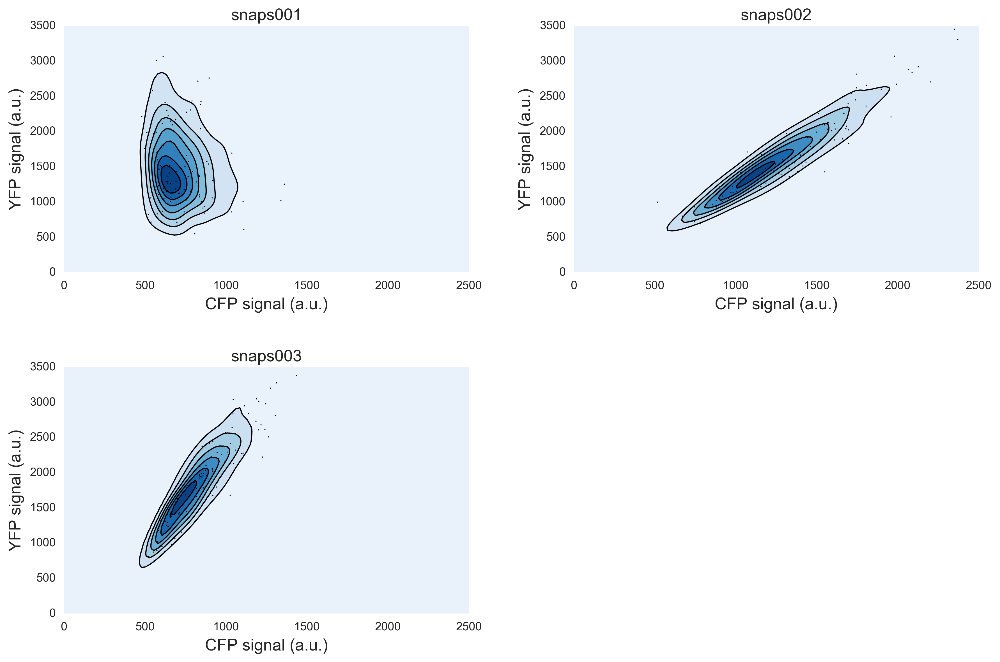

In [15]:
def kde_2d(x, y, bandwidth, x_range, y_range):
    """
    Perform 2D kernel density estimation.  Return arrays of 
    x values, y values, and probability values for use in contour 
    plotting.  Also returns the KDE instance itself for later use.
    """
    # Set up values for plotting KDE
    x_min, x_max = x_range
    y_min, y_max = y_range
    xx, yy = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
    positions = np.vstack([xx.ravel(), yy.ravel()])

    # Build data matrix to send to KDE
    data = np.vstack((x, y))

    # If numeric bandwidth, adjust for SciPy's scaling bandwidth with covariance
    if type(bandwidth) is not str:
        bandwidth /= data.std(ddof=1) 

    # Compute kernel and evaluate
    kde = st.gaussian_kde(data, bw_method=bandwidth)
    p = kde.evaluate(positions)

    # Reshape the output
    return xx, yy, np.reshape(p.transpose(), xx.shape), kde

# Perform 2D KDE on each data set with automatic bandwidth using Scott's method
xx, yy, pp, kde = [], [], [], []
for prefix in prefixes:
    xx_, yy_, pp_, kde_ = kde_2d(mean_int[prefix]['cfp'], mean_int[prefix]['yfp'], 
                                 'scott', [0, 2500], [0, 3500])
    xx.append(xx_)
    yy.append(yy_)
    pp.append(pp_)
    kde.append(kde_)
    

# Plot the results with a subset of the real data overlaid
fig, ax = plt.subplots(2, 2, figsize=(12, 8))
inds = [(0, 0), (0, 1), (1, 0)]
for i, prefix in enumerate(prefixes):
    # Overlay 100 randomly selected data points
    rand_inds = np.random.choice(np.arange(len(mean_int[prefix]['cfp'])), 100)
    ax[inds[i]].plot(mean_int[prefix]['cfp'].values[rand_inds], 
                     mean_int[prefix]['yfp'].values[rand_inds],
                    'k.', markersize=2)

    # Plot contours of the KDE
    ax[inds[i]].contourf(xx[i], yy[i], pp[i], cmap=plt.cm.Blues)
    ax[inds[i]].contour(xx[i], yy[i], pp[i], colors='k', linewidths=1)

    # Set the axis limits for nice viewing
    ax[inds[i]].set_xlim((0, 2500))
    ax[inds[i]].set_ylim((0, 3500))
    
    # Label the plot
    ax[inds[i]].set_title(prefix)
    ax[inds[i]].set_xlabel('CFP signal (a.u.)')
    ax[inds[i]].set_ylabel('YFP signal (a.u.)')

# Tidy up plot
ax[1,1].axis('off')
fig.tight_layout(w_pad=3, h_pad=3)

We see what we expected for the controls (`snaps002` and `snaps003`), a bivariate Gaussian with strong covariance.  We do not see a strong diagonal component to the `snaps001` sample, suggesting there is not a strong correlation or anticorrelation between the two sigma factors.

Now, we proceed to our goal of comparing the probability distributions $P(c\mid D_1)$ and $P(c \mid D_2)$.  To do this, we will construct a **Q-Q plot**.  These plots are used to compare two probability distributions.  We take the same number of samples from each distribution, sort them, and then plot them against each other.  If the distributions are identical, this plot will be a line of slope one and intercept zero.  If the distributions are linearly related, the plot will fall on a line.  Deviations from linear behavior of this curve is indicative of important differences between the distributions, such as one have longer tails or more skew than the other.  We will first build this plot by sampling out of the real data set.  We have more samples from `scan002` than from `scan001`, so we randomly choose samples from the former.

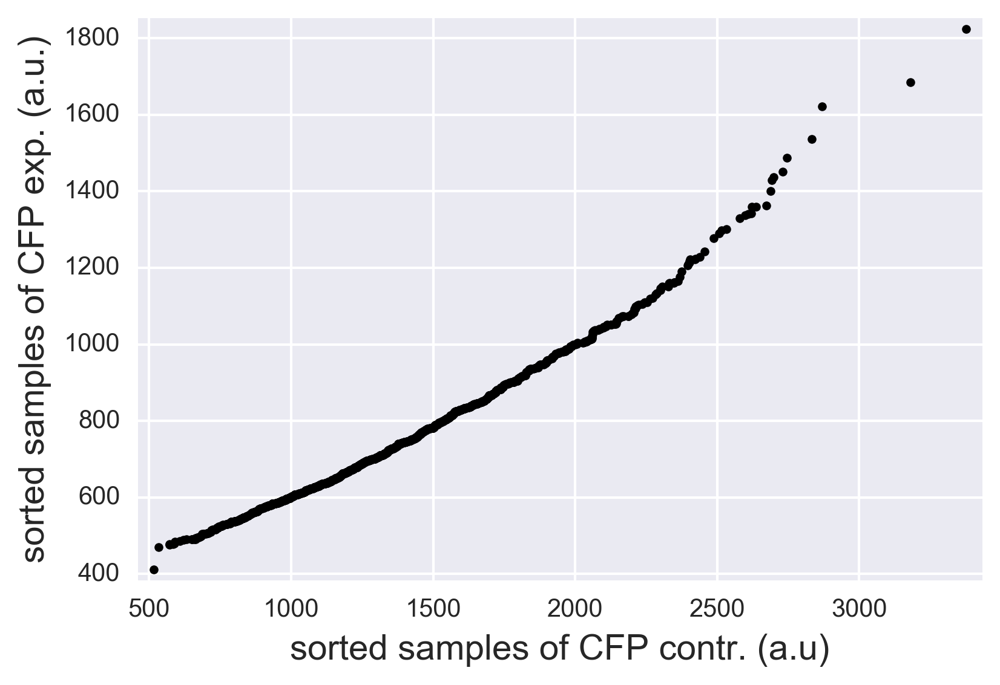

In [17]:
# Draw samples from snaps002 CFP channel
snaps002_sample = np.sort(np.random.choice(mean_int['snaps002']['cfp'].values,
                                          len(mean_int['snaps001']['cfp']),
                                          replace=False))

# Plot against each other
plt.plot(snaps002_sample, np.sort(mean_int['snaps001']['cfp']), 'k.')
plt.margins(0.02)
plt.xlabel('sorted samples of CFP contr. (a.u)')
plt.ylabel('sorted samples of CFP exp. (a.u.)');

We see that, with the exception of the high intensity samples, the Q-Q plot is approximately linear.  This suggests that the distributions are linearly related, which we would expect for identical distributions, save for the total fluorescent intensity being different between the two different acquisitions of images.

We can got a bit further with this analysis.  We will instead sample many times from the distribution of CFP intensities for `snaps002` and generate a confidence interval containing 95% of our samples.  Conveniently, we can sample out of the kernel density estimate distribution using the built-in `kde.resample` method.  We will also plot a line describing the linear relationship of the data, and shade the region of the plot that contains 95% of the observed intensities in `snaps001`.

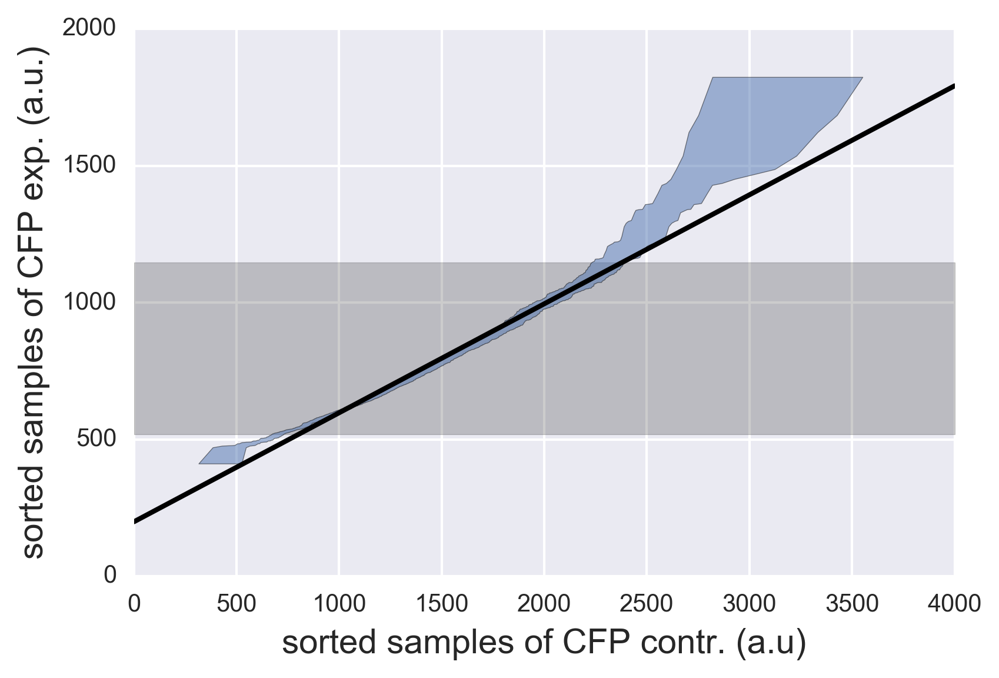

In [19]:
def qq_plot(ax, data, control_kde, n_samples=1000):
    """
    Generate a Q-Q plot from experimental data (y-axis) with 
    sampling out of a control KDE.
    """
    # Sample the values from control distribution
    control_sample = np.array(
        [np.sort(control_kde.resample(size=len(data)).flatten()) 
                                            for _ in range(n_samples)])

    # For each point, compute interval
    low_x, median_x, up_x = np.percentile(control_sample, (2.5, 50.0, 97.5), 
                                          axis=0)

    # Get middle 95% quantile of control data
    quantiles = np.percentile(data, (2.5, 97.5))

    # Plot Q-Q plot
    ax.fill_betweenx(np.sort(data), low_x, up_x, alpha=0.5, zorder=2)

    # Get approximate line
    m, b = np.polyfit(median_x, np.sort(data), 1)
    x = np.array(ax.get_xlim())
    ax.plot(x, m * x + b, 'k-')

    # Shade the region with the 95% of the data
    ax.fill_between(ax.get_xlim(), quantiles[1], quantiles[0], color='k', 
                    alpha=0.2)

    return ax

# Generate univariate KDE from samples
control_kde = st.gaussian_kde(mean_int['snaps002']['cfp'].values, 
                              bw_method='scott')

# Generate plot
fig, ax = plt.subplots(1, 1)
qq_plot(ax, mean_int['snaps001']['cfp'].values, control_kde)

# Label axes
ax.set_xlabel('sorted samples of CFP contr. (a.u)')
ax.set_ylabel('sorted samples of CFP exp. (a.u.)');

The gray region contains 95% of the measured CFP values in `snaps001` and the blue region contains 95% of all samples from the control distribution.  So, nearly all measurements come from a nearly identical distribution as control.  This suggests that $\sigma_W$ does not affect $\sigma_B$.

We now do the same analysis for the effect of $\sigma_W$ on $\sigma_B$, comparing $P(y \mid D_1)$ and $P(y \mid D_3)$. 

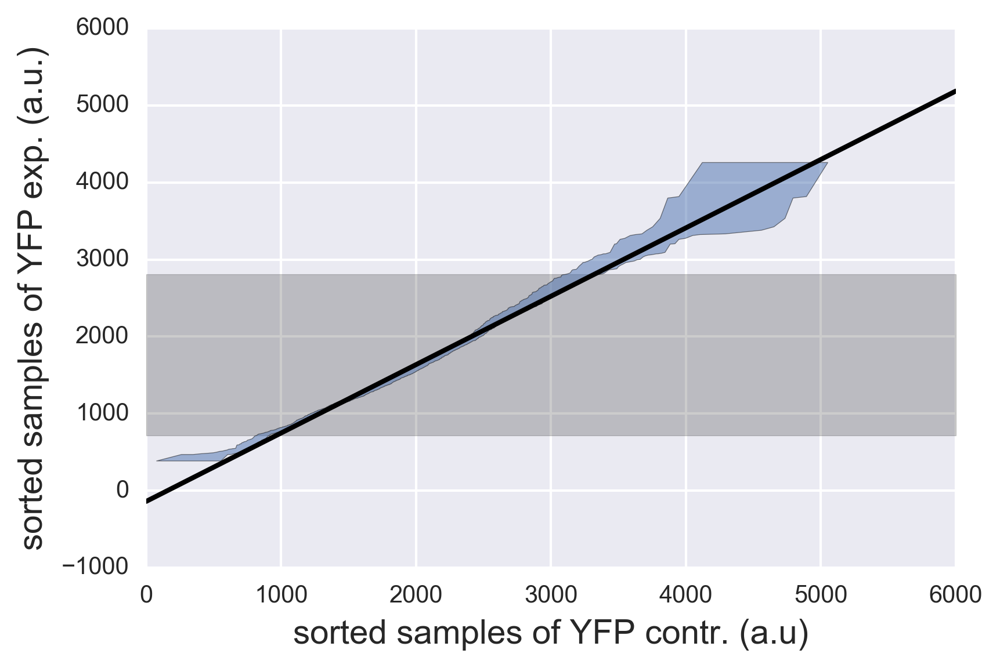

In [21]:
# Generate univariate KDE from samples
control_kde = st.gaussian_kde(mean_int['snaps003']['yfp'].values, 
                              bw_method='scott')

# Generate plot
fig, ax = plt.subplots(1, 1)
qq_plot(ax, mean_int['snaps001']['yfp'].values, control_kde)

# Label axes
ax.set_xlabel('sorted samples of YFP contr. (a.u)')
ax.set_ylabel('sorted samples of YFP exp. (a.u.)');

Here again we see no influence of $\sigma_B$ on $\sigma_W$.  Based on these analyses, we conclude that $\sigma_B$ and $\sigma_W$ operate independently of each other.